In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, InputLayer, Conv1D, Flatten, MaxPooling1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam

#1. Load and explore the Climate1 data

In [7]:
from google.colab import files
upload = files.upload()

Saving climate_P_T (1).csv to climate_P_T (1).csv


In [48]:
df = pd.read_csv("climate_P_T (1).csv")
df.head()

,Date Time,p (mbar),Temperature,Day sin,Day cos,Year sin,Year cos
0,2009-01-01 01:00:00,996.50,-8.05,0.258819,0.965926,0.010049,0.999950
1,2009-01-01 02:00:00,996.62,-8.88,0.500000,0.866025,0.010766,0.999942
2,2009-01-01 03:00:00,996.84,-8.81,0.707107,0.707107,0.011483,0.999934
3,2009-01-01 04:00:00,996.99,-9.05,0.866025,0.500000,0.012199,0.999926
4,2009-01-01 05:00:00,997.46,-9.63,0.965926,0.258819,0.012916,0.999917


In [49]:
def basic_eda(df):
    print("-------------------------------TOP 5 RECORDS-----------------------------")
    print(df.head(5))
    print()
    
    print("-------------------------------INFO--------------------------------------")
    print(df.info())
    print()
    
    print("-------------------------------Describe----------------------------------")
    print(df.describe())
    print()
    
    print("-------------------------------Columns-----------------------------------")
    print(df.columns)
    print()
    
    print("-------------------------------Data Types--------------------------------")
    print(df.dtypes)
    print()
    
    print("----------------------------Missing Values-------------------------------")
    print(df.isnull().sum())
    print()
    
    print("----------------------------NULL values----------------------------------")
    print(df.isna().sum())
    print()
    
    print("--------------------------Shape Of Data---------------------------------")
    print(df.shape)
    print()

    print("_________________________ duplicated data______________________")
    print(f"Dataset has {df.duplicated().sum()} duplicated data")
    print()

    print("============================================================================ \n")


In [50]:
basic_eda(df)

-------------------------------TOP 5 RECORDS-----------------------------
             Date Time  p (mbar)  Temperature   Day sin   Day cos  Year sin  \
0  2009-01-01 01:00:00    996.50        -8.05  0.258819  0.965926  0.010049   
1  2009-01-01 02:00:00    996.62        -8.88  0.500000  0.866025  0.010766   
2  2009-01-01 03:00:00    996.84        -8.81  0.707107  0.707107  0.011483   
3  2009-01-01 04:00:00    996.99        -9.05  0.866025  0.500000  0.012199   
4  2009-01-01 05:00:00    997.46        -9.63  0.965926  0.258819  0.012916   

   Year cos  
0  0.999950  
1  0.999942  
2  0.999934  
3  0.999926  
4  0.999917  

-------------------------------INFO--------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70091 entries, 0 to 70090
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date Time    70091 non-null  object 
 1   p (mbar)     70091 non-null  float64
 2   Temperature

###**Interpretation : my dataset contains 70091 rows and 7 columns, does not contain missing values with 24 duplicated data**

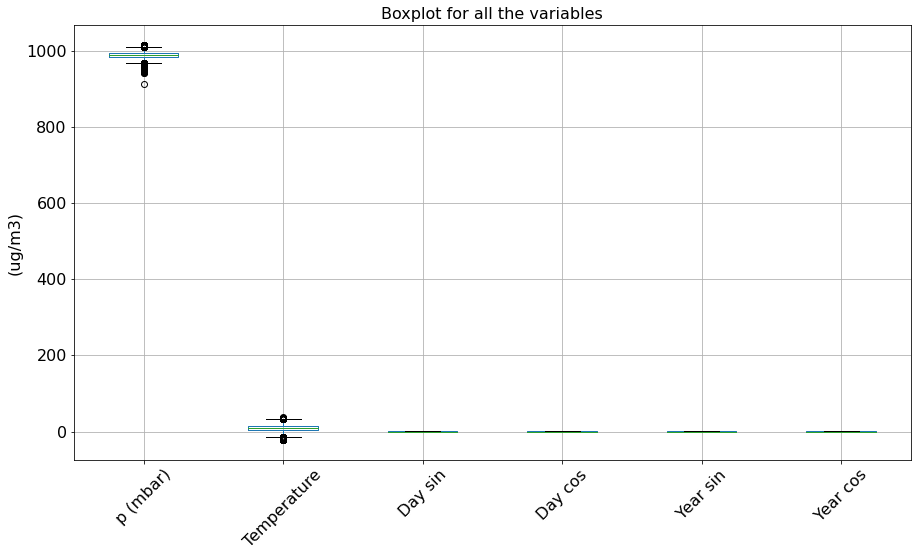

In [51]:
import matplotlib.pyplot as plt
boxplot = df.boxplot( figsize=(15, 8), rot=45, fontsize=16)
plt.title('Boxplot for all the variables',fontsize=16)
plt.ylabel('(ug/m3)', fontsize=16)
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f43be7c1af0>,
      dtype=object)

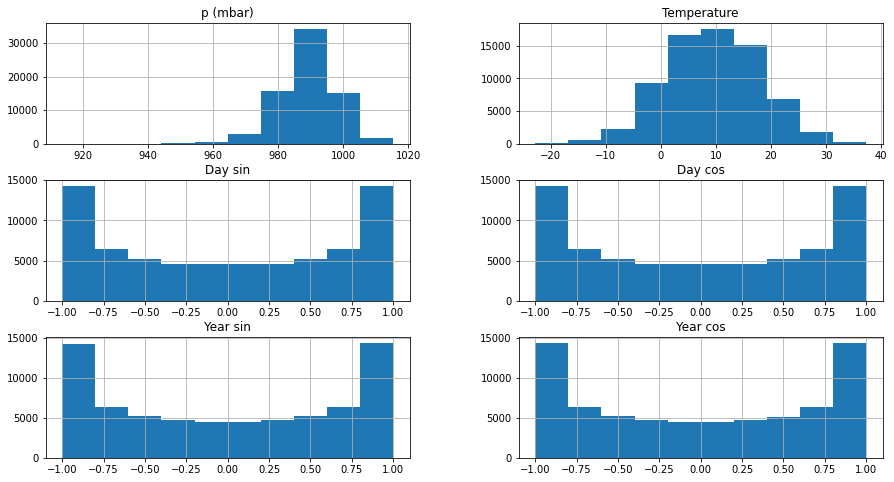

In [52]:
df.hist(figsize=(15,8))

###**Interpretation : the distribution of the pressure and temperature features has a normal distribution**

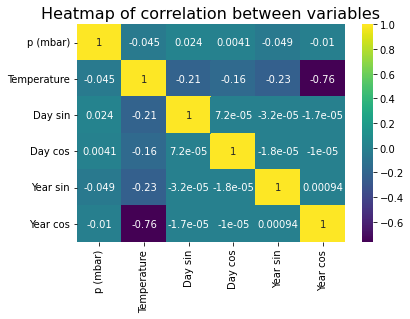

In [53]:
import seaborn as sns
#rcParams['figure.figsize']=15,8
sns.heatmap(df.corr(),annot=True,cmap='viridis')
plt.title('Heatmap of correlation between variables',fontsize=16)
plt.show()

###**Interpretation: pressure and temperature features are weakly correlated.**

#2. Plot the ”Temperature” and ”Pressure” and discuss Periodicity

In [54]:
df.set_index("Date Time", inplace = True)


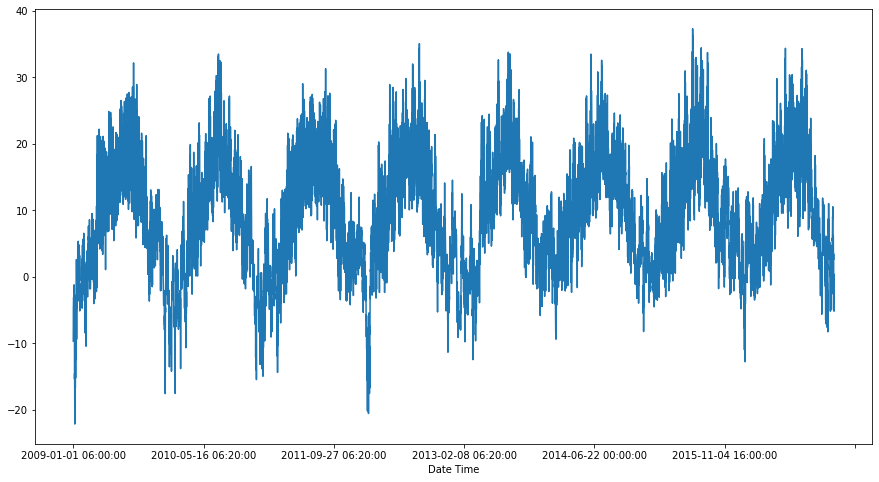

In [55]:
data = df[5::6]
temp_data = data['Temperature']
temp_data.plot(figsize=(15,8))

###**Interpretation: According to the plot, the periodicity of the temperature is almost annual**

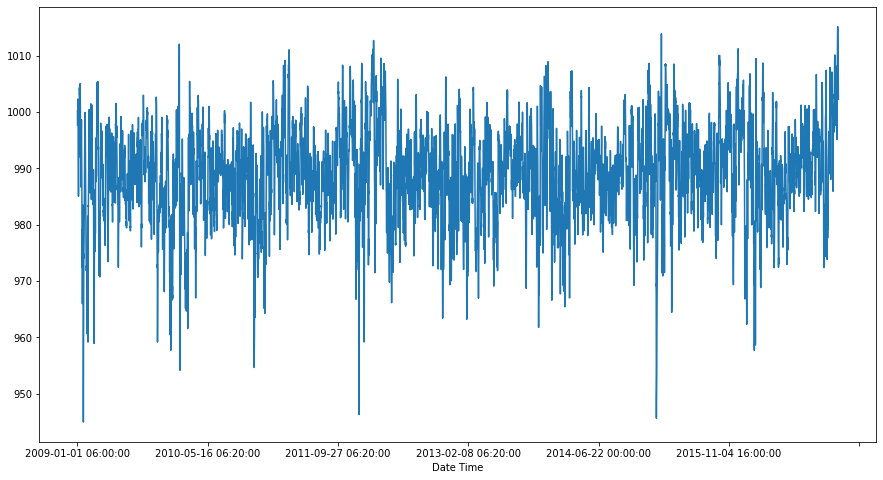

In [56]:
data = df[5::6]
pressure_data = data['p (mbar)']
pressure_data.plot(figsize=(15,8))

###**Interpretation : from the plot, there is no clear periodicity for the pressure**

##3. Partition the data into 80% training (30% of which is reserved for validation step) and the remaining 20% for testing

In [57]:
# Prepare the input X and target Y
def get_train_test(data, split_percent=0.8, minmax = False):
  data = np.array(data.values.astype('float32'))
  if minmax == True:
    scaler = MinMaxScaler(feature_range=(0, 1))
    data = scaler.fit_transform(data)#(data.reshape(-1, 1))
  n = len(data)
  # Point for splitting data into train and test
  split = int(n*split_percent)
  train_data = data[:split,:]
  test_data = data[split:, :]
  return pd.DataFrame(train_data), pd.DataFrame(test_data)

In [58]:
train, test = get_train_test(df, split_percent = 0.8, minmax = True)
train, validation = get_train_test(train, split_percent = 0.7, minmax = True)


#4. Reshape the data into :
#• Input data sequences (samples × window size × 6).
#• Label data sequences (samples × 2)
#where window size stands for amount of samples taken under consideration to forecast the next value (here equals 5).

In [59]:
def get_XY(df, window_size=6):
  df_as_np = df.to_numpy()
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = df_as_np[i+window_size][:2]
    y.append(label)
  return np.array(X), np.array(y)

In [60]:
X_train, Y_train = get_XY(train, 5)
X_val, Y_val = get_XY(validation, 5)
X_test, Y_test = get_XY(test, 5)


print('Shape of Training set is ', train.shape)
print('Shape of Validation set is ', validation.shape)
print('Shape of Testing set is ', test.shape)

Shape of Training set is  (39250, 6)
Shape of Validation set is  (16822, 6)
Shape of Testing set is  (14019, 6)


##5. Standardize the data

###**I have used it before in the get_train_test function where I set minmax=True.**
train, test = get_train_test(df, split_percent = 0.8, minmax = True)
train, validation = get_train_test(train, split_percent = 0.7, minmax = True)

##6. Build and compile model1 (1D-CNN model) with the following characteristics:
##• 1D-CNN layer containing 64 units.
##• Dense layer with 8 units.
##• Output layer (Dense layer with 2 units)

In [61]:
def CNN_1D(n_filters, dense_layers, kernel_s, dense_units, input_shape, activations):
    model = Sequential()
    model.add(InputLayer(input_shape))
    model.add(Conv1D(n_filters,
                     kernel_size = kernel_s,
                     activation = activations[0]))
    model.add(Flatten())
    for i in range(dense_layers):
      model.add(Dense(units=dense_units[i], activation=activations[i]))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=[RootMeanSquaredError()])
    return model

In [62]:
dense_layers = 2
activ = ['relu','relu']
dense_units=[8, 2]
cnn_units = 64

CNN = CNN_1D(n_filters = cnn_units,
             dense_layers = dense_layers,
             kernel_s = 5,
             dense_units = dense_units,
             input_shape = X_train.shape[1:],
             activations = activ)


##7. Build and compile model2 (a simple LSTM model) with the following characteristics:
##• One LSTM cell containing 64 units.
##• Dense layer with 8 units.
##• Output layer (Dense layer with 2 units)

In [63]:
def Simple_LSTM(hidden_units, dense_layers, dense_units, input_shape, activations):
    model = Sequential()
    model.add(InputLayer(input_shape))
    model.add(LSTM(hidden_units))
    for i in range(dense_layers):
      model.add(Dense(units=dense_units[i], activation=activations[i]))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=[RootMeanSquaredError()])
    return model

In [81]:
dense_layers = 2
activ = ['relu','relu']
dense_units=[8, 2]
lstm_units = 64


model = Simple_LSTM(hidden_units=lstm_units, 
                    dense_layers=dense_layers,
                    dense_units=dense_units,
                    input_shape=X_train.shape[1:],
                    activations = activ)


##8. Train and test model1 and model2.

###- CNN

In [82]:
history1 = CNN.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10  )

Epoch 1/10
1227/1227 [==============================] - 3s 3ms/step - loss: 0.1545 - root_mean_squared_error: 0.3931 - val_loss: 0.1669 - val_root_mean_squared_error: 0.4086
Epoch 2/10
1227/1227 [==============================] - 3s 3ms/step - loss: 0.1545 - root_mean_squared_error: 0.3931 - val_loss: 0.1668 - val_root_mean_squared_error: 0.4084
Epoch 3/10
1227/1227 [==============================] - 3s 2ms/step - loss: 0.1545 - root_mean_squared_error: 0.3931 - val_loss: 0.1668 - val_root_mean_squared_error: 0.4084
Epoch 4/10
1227/1227 [==============================] - 3s 2ms/step - loss: 0.1545 - root_mean_squared_error: 0.3931 - val_loss: 0.1668 - val_root_mean_squared_error: 0.4084
Epoch 5/10
1227/1227 [==============================] - 5s 4ms/step - loss: 0.1544 - root_mean_squared_error: 0.3930 - val_loss: 0.0398 - val_root_mean_squared_error: 0.1996
Epoch 6/10
1227/1227 [==============================] - 3s 3ms/step - loss: 0.0011 - root_mean_squared_error: 0.0335 - val_loss: 3

###- LSTM

In [97]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=20)

Epoch 1/20
1227/1227 [==============================] - 8s 6ms/step - loss: 0.2827 - root_mean_squared_error: 0.5317 - val_loss: 0.2896 - val_root_mean_squared_error: 0.5382
Epoch 2/20
1227/1227 [==============================] - 8s 6ms/step - loss: 0.2827 - root_mean_squared_error: 0.5317 - val_loss: 0.2896 - val_root_mean_squared_error: 0.5382
Epoch 3/20
1227/1227 [==============================] - 7s 6ms/step - loss: 0.2827 - root_mean_squared_error: 0.5317 - val_loss: 0.2896 - val_root_mean_squared_error: 0.5382
Epoch 4/20
1227/1227 [==============================] - 8s 6ms/step - loss: 0.2827 - root_mean_squared_error: 0.5317 - val_loss: 0.2896 - val_root_mean_squared_error: 0.5382
Epoch 5/20
1227/1227 [==============================] - 8s 6ms/step - loss: 0.2827 - root_mean_squared_error: 0.5317 - val_loss: 0.2896 - val_root_mean_squared_error: 0.5381
Epoch 6/20
1227/1227 [==============================] - 8s 6ms/step - loss: 0.2827 - root_mean_squared_error: 0.5317 - val_loss: 0

##9. Plot the predicted values for Temperature and Pressure provided by both models in two separate figures

In [84]:
def plot_result(trainY, testY, train_predict, test_predict):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(18, 6), dpi=80)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Observation number after given time steps')
    plt.ylabel('Sunspots scaled')

###- CNN

In [85]:
train_predictions = CNN.predict(X_train)
test_predictions = CNN.predict(X_test)



438/438 [==============================] - 1s 1ms/step


### Plot the predicted values Pressure 

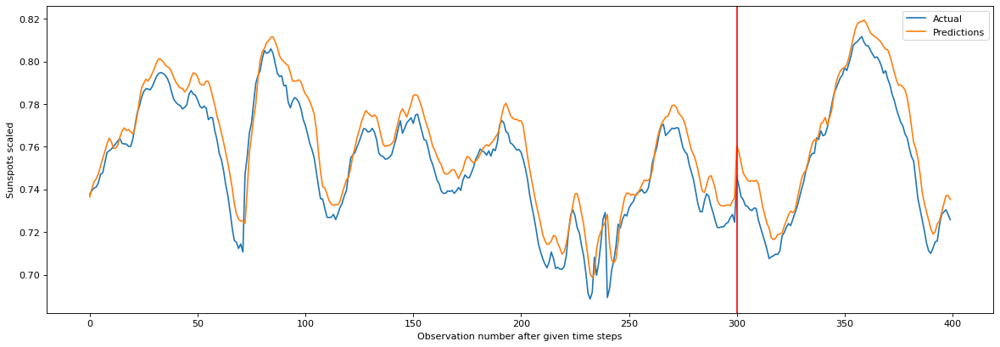

In [86]:
plot_result(Y_train[-300:,0], Y_test[:100,0], train_predictions[-300:,0], test_predictions[:100,0])

###Plot the predicted values for temperature

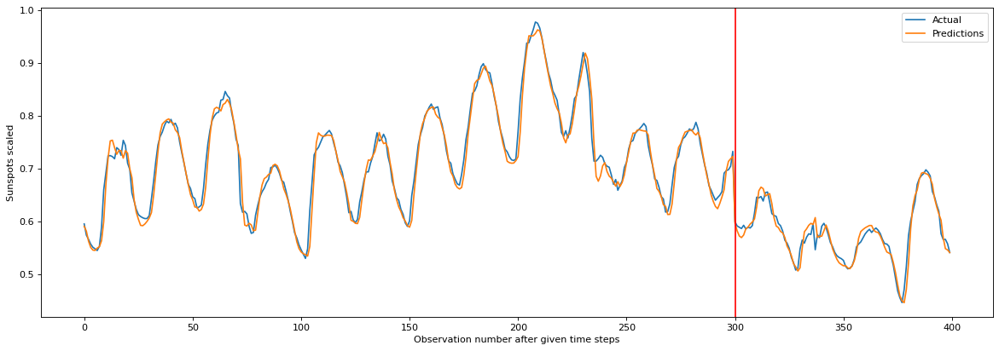

In [87]:
plot_result(Y_train[-300:,1], Y_test[:100,1], train_predictions[-300:,1], test_predictions[:100,1])

###- LSTM

In [98]:
train_predictions = model.predict(X_train)
test_predictions= model.predict(X_test)


438/438 [==============================] - 1s 2ms/step


### Plot the predicted values for Pressure

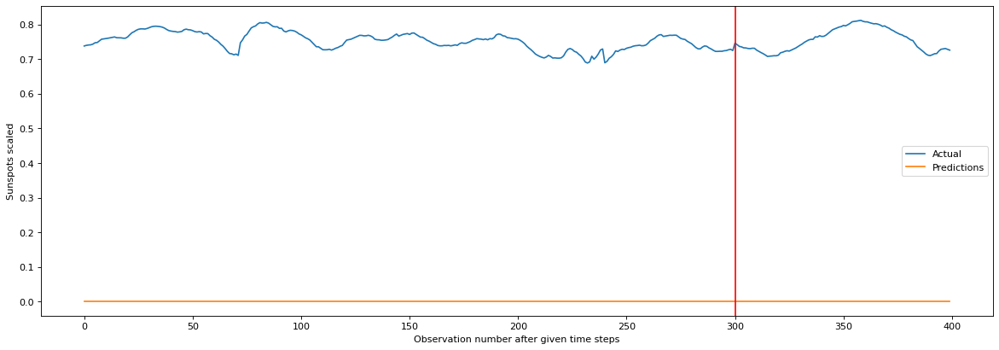

In [99]:
plot_result(Y_train[-300:,0], Y_test[:100,0], train_predictions[-300:,0], test_predictions[:100,0])

### Plot the predicted values for temperature

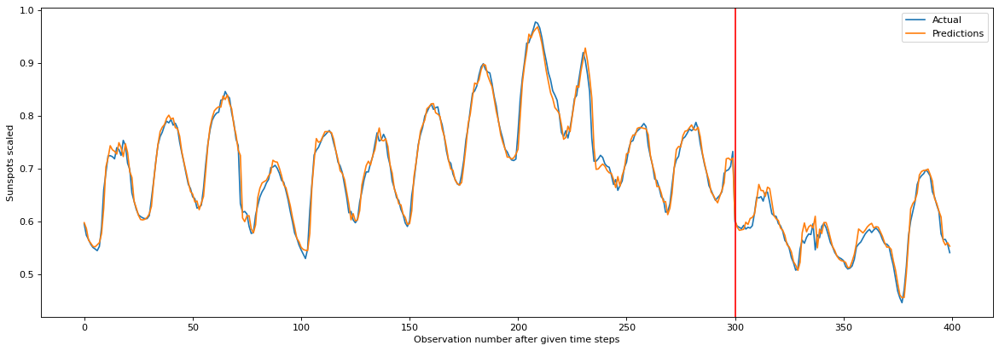

In [100]:
plot_result(Y_train[-300:,1], Y_test[:100,1], train_predictions[-300:,1], test_predictions[:100,1])

##10. Report model1 and model2 results in terms of RMSE. Compare and discuss.

In [101]:
# Plot the validation and training curves separately
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  rmse = history.history["root_mean_squared_error"]
  val_rmse = history.history["val_root_mean_squared_error"]

  epochs = range(len(history.history["loss"])) # how many epochs did we run for?

  # Plot loss
  plt.plot(epochs, loss, label="training_loss")
  plt.plot(epochs, val_loss, label="val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, rmse, label="training_rmse")
  plt.plot(epochs, val_rmse, label="val_rmse")
  plt.title("RMSE")
  plt.xlabel("epochs")
  plt.legend();

###- CNN

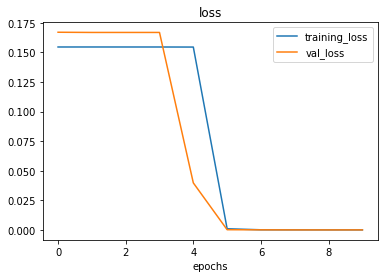

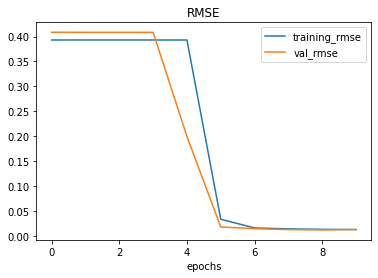

In [102]:
plot_loss_curves(history1)

### - LSTM

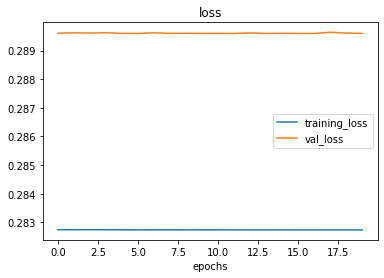

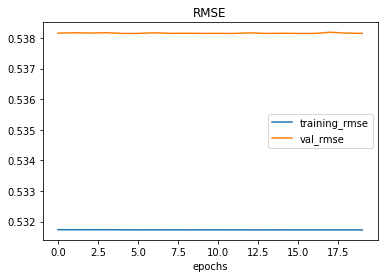

In [103]:
plot_loss_curves(history)

###**Interpretation : I notice that with the same hyperparameter between the two models, the CNN has demonstrated good performance for the two variables and its algorithm converges to the result after 5 epochs (this observation is very interesting for the framing of my choice of hyperparameter since I will use the hyperparameter tuning with kerasTuner and tensorboard for visualization). On the other hand, the lstm model was not able to converge towards the result with the hyperparameter used. Note that at the level of the prediction plot, we can see that it offers good prediction for the feature temperature and it could not predict the feature pressure. At this stage to rule on my hypothesis concerning the LSTM, I will use another more developed and see the predictions.**

###- LSTM_dev

In [105]:
dense_layers = 3
activ = ['relu','relu','relu']
dense_units=[32,8, 2]
lstm_units = 128


model = Simple_LSTM(hidden_units=lstm_units, 
                    dense_layers=dense_layers,
                    dense_units=dense_units,
                    input_shape=X_train.shape[1:],
                    activations = activ)
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10)


Epoch 1/10
1227/1227 [==============================] - 18s 13ms/step - loss: 0.0021 - root_mean_squared_error: 0.0463 - val_loss: 3.1790e-04 - val_root_mean_squared_error: 0.0178
Epoch 2/10
1227/1227 [==============================] - 17s 14ms/step - loss: 3.0896e-04 - root_mean_squared_error: 0.0176 - val_loss: 1.8622e-04 - val_root_mean_squared_error: 0.0136
Epoch 3/10
1227/1227 [==============================] - 16s 13ms/step - loss: 2.0814e-04 - root_mean_squared_error: 0.0144 - val_loss: 1.8809e-04 - val_root_mean_squared_error: 0.0137
Epoch 4/10
1227/1227 [==============================] - 16s 13ms/step - loss: 1.6873e-04 - root_mean_squared_error: 0.0130 - val_loss: 1.3026e-04 - val_root_mean_squared_error: 0.0114
Epoch 5/10
1227/1227 [==============================] - 15s 12ms/step - loss: 1.4869e-04 - root_mean_squared_error: 0.0122 - val_loss: 1.0910e-04 - val_root_mean_squared_error: 0.0104
Epoch 6/10
1227/1227 [==============================] - 15s 12ms/step - loss: 1.3178

In [106]:
train_predictions = model.predict(X_train)
test_predictions= model.predict(X_test)


438/438 [==============================] - 2s 4ms/step


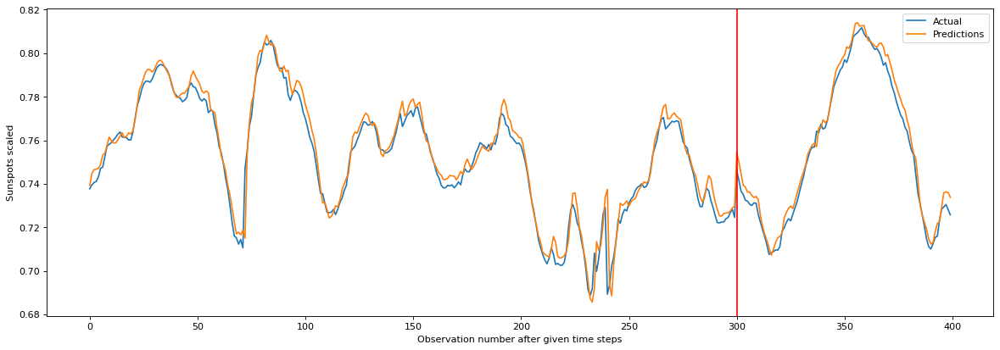

In [107]:
plot_result(Y_train[-300:,0], Y_test[:100,0], train_predictions[-300:,0], test_predictions[:100,0])

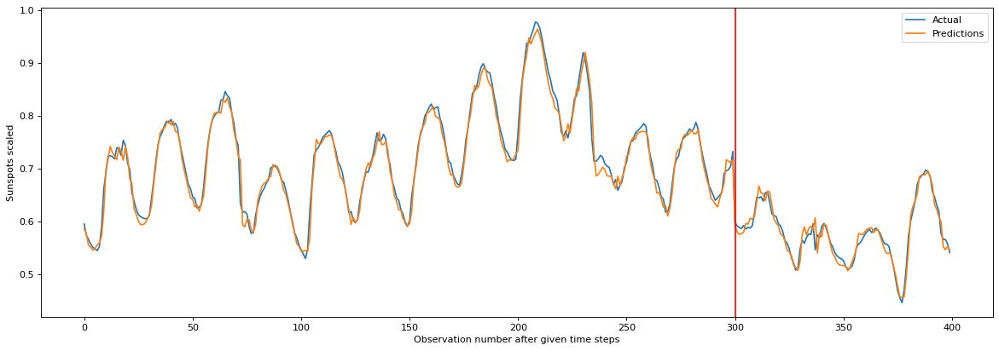

In [108]:
plot_result(Y_train[-300:,1], Y_test[:100,1], train_predictions[-300:,1], test_predictions[:100,1])

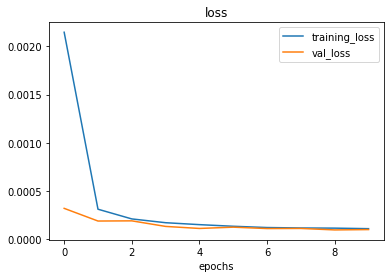

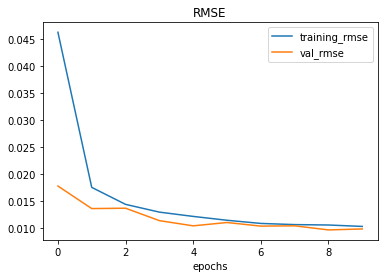

In [109]:
plot_loss_curves(history)

###**Interpretation: indeed the hypothesis that I put is verified, now with a lstm of 3 hiddens layers offers excellent results, it converges after 5 epochs**

# 10 - Hyperparameter Tuning with Keras Tuner and tensorboard for visualization for the CNN model.
###I will make a hyperparameter tuning on the number of hidden layers and on the learning_rate of the adam optimizer while adding the drop out .




In [110]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [111]:
import pathlib
import shutil
import tempfile

from tensorflow.python.keras.callbacks import TensorBoard

logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboard_logs"
shutil.rmtree(logdir, ignore_errors=True)

In [112]:
pip install -q -U keras-tuner

     |████████████████████████████████| 135 kB 14.3 MB/s 
     |████████████████████████████████| 1.6 MB 50.5 MB/s 


In [150]:
def model_builder(hp):
  model = tf.keras.models.Sequential()
  model.add(tf.keras.layers.InputLayer(X_train.shape[1:]))
  model.add(tf.keras.layers.Conv1D(8, kernel_size=6,activation='relu',padding='same'))
  model.add(tf.keras.layers.Dropout(0.2))
  model.add( tf.keras.layers.Flatten())

  hp_activation = hp.Choice('activation', values=['relu', 'linear'])
  hp_layer_1 = hp.Int('layer_1', min_value=8, max_value=64, step=32)
  hp_layer_2 = hp.Int('layer_2', min_value=8, max_value=64, step=32)
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

  model.add(tf.keras.layers.Dense(units=hp_layer_1, activation=hp_activation))
  model.add(tf.keras.layers.Dense(units=hp_layer_2, activation=hp_activation))
  model.add(tf.keras.layers.Dense(units=2, activation='relu'))

  

  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss='mse',
                metrics=[RootMeanSquaredError()])
  
  return model
  
  

In [151]:
import keras_tuner as kt

tuner = kt.Hyperband(model_builder,
                     
                     objective='val_loss',
                     max_epochs=5,
                     factor=3,
                     directory='dir',
                     project_name='x')

In [152]:
tuner.search(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10 )

In [153]:
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_hps

In [154]:
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10 , callbacks=[
                               tf.keras.callbacks.TensorBoard(logdir)])

Epoch 1/10
1227/1227 [==============================] - 5s 4ms/step - loss: 0.0064 - root_mean_squared_error: 0.0799 - val_loss: 0.0015 - val_root_mean_squared_error: 0.0392
Epoch 2/10
1227/1227 [==============================] - 3s 3ms/step - loss: 0.0028 - root_mean_squared_error: 0.0525 - val_loss: 5.3942e-04 - val_root_mean_squared_error: 0.0232
Epoch 3/10
1227/1227 [==============================] - 3s 3ms/step - loss: 0.0021 - root_mean_squared_error: 0.0455 - val_loss: 5.6662e-04 - val_root_mean_squared_error: 0.0238
Epoch 4/10
1227/1227 [==============================] - 4s 3ms/step - loss: 0.0020 - root_mean_squared_error: 0.0442 - val_loss: 0.0011 - val_root_mean_squared_error: 0.0332
Epoch 5/10
1227/1227 [==============================] - 3s 3ms/step - loss: 0.0019 - root_mean_squared_error: 0.0436 - val_loss: 7.9937e-04 - val_root_mean_squared_error: 0.0283
Epoch 6/10
1227/1227 [==============================] - 4s 3ms/step - loss: 0.0018 - root_mean_squared_error: 0.0429 -

In [155]:
import pandas as pd

pd.DataFrame(history.history)

,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
0,0.006376,0.079850,0.001537,0.039208
1,0.002760,0.052539,0.000539,0.023225
2,0.002073,0.045526,0.000567,0.023804
3,0.001954,0.044200,0.001100,0.033162
4,0.001900,0.043586,0.000799,0.028273
5,0.001844,0.042940,0.000444,0.021078
6,0.001906,0.043659,0.000324,0.017986
7,0.001838,0.042876,0.000404,0.020089
8,0.001812,0.042562,0.000509,0.022568
9,0.001769,0.042063,0.000665,0.025787


In [156]:
%load_ext tensorboard
%tensorboard --logdir {logdir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 23037), started 0:46:37 ago. (Use '!kill 23037' to kill it.)

<IPython.core.display.Javascript object>

###- Prediction for pression

438/438 [==============================] - 1s 2ms/step


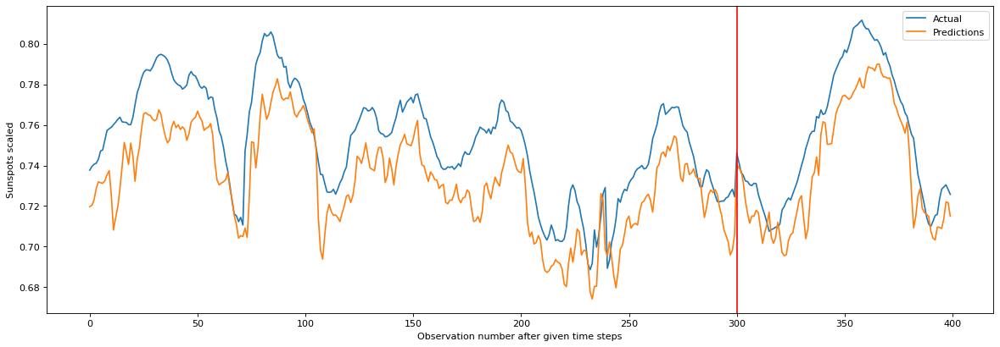

In [157]:
train_predictions = model.predict(X_train)
test_predictions= model.predict(X_test)
plot_result(Y_train[-300:,0], Y_test[:100,0], train_predictions[-300:,0], test_predictions[:100,0])

###- Prediction for temperature

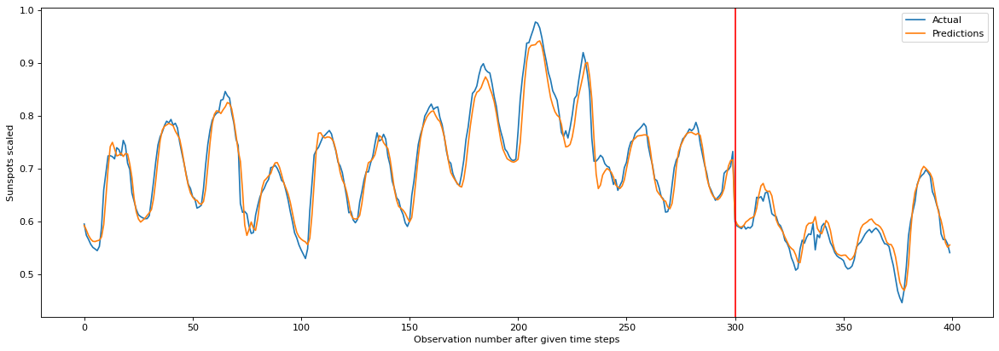

In [158]:
plot_result(Y_train[-300:,1], Y_test[:100,1], train_predictions[-300:,1], test_predictions[:100,1])

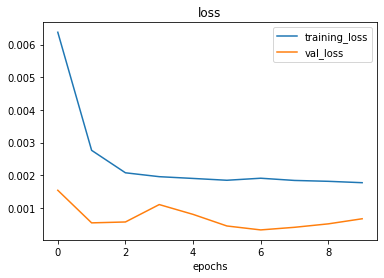

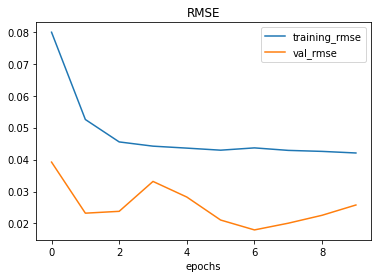

In [159]:
plot_loss_curves(history)

###**Interpretation : From the RMSE plot, I see that the model could not converge after 10 epochs .**

#11- I'm going to use a CNN plus devlopoer and a combination of cnn and lstm to see if the prediction will be improved or not and also to rule on the best model

##I will add drop out and MaxPooling1D

In [130]:
def cnn_model( n_horizon):
    
    model = tf.keras.models.Sequential([
        
        tf.keras.layers.InputLayer(X_train.shape[1:]),
        tf.keras.layers.Conv1D(64, kernel_size=6, activation='relu',padding='same'),
        tf.keras.layers.MaxPooling1D(2),
        tf.keras.layers.Conv1D(64, kernel_size=3, activation='relu',padding='same'),
        tf.keras.layers.MaxPooling1D(2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(128),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(n_horizon)
    ], name="CNN")

    
    
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=[RootMeanSquaredError()])
    
    return model

In [131]:
CNN=cnn_model(2)

In [132]:
history = CNN.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10)

Epoch 1/10
1227/1227 [==============================] - 7s 5ms/step - loss: 0.0086 - root_mean_squared_error: 0.0930 - val_loss: 8.7109e-04 - val_root_mean_squared_error: 0.0295
Epoch 2/10
1227/1227 [==============================] - 6s 5ms/step - loss: 0.0028 - root_mean_squared_error: 0.0525 - val_loss: 5.6323e-04 - val_root_mean_squared_error: 0.0237
Epoch 3/10
1227/1227 [==============================] - 6s 5ms/step - loss: 0.0019 - root_mean_squared_error: 0.0441 - val_loss: 4.4514e-04 - val_root_mean_squared_error: 0.0211
Epoch 4/10
1227/1227 [==============================] - 6s 5ms/step - loss: 0.0014 - root_mean_squared_error: 0.0380 - val_loss: 4.3469e-04 - val_root_mean_squared_error: 0.0208
Epoch 5/10
1227/1227 [==============================] - 6s 5ms/step - loss: 0.0011 - root_mean_squared_error: 0.0334 - val_loss: 2.2396e-04 - val_root_mean_squared_error: 0.0150
Epoch 6/10
1227/1227 [==============================] - 6s 5ms/step - loss: 9.3953e-04 - root_mean_squared_err

In [133]:
train_predictions = CNN.predict(X_train)
test_predictions = CNN.predict(X_test)

438/438 [==============================] - 2s 3ms/step


### Plot the predicted values Pressure

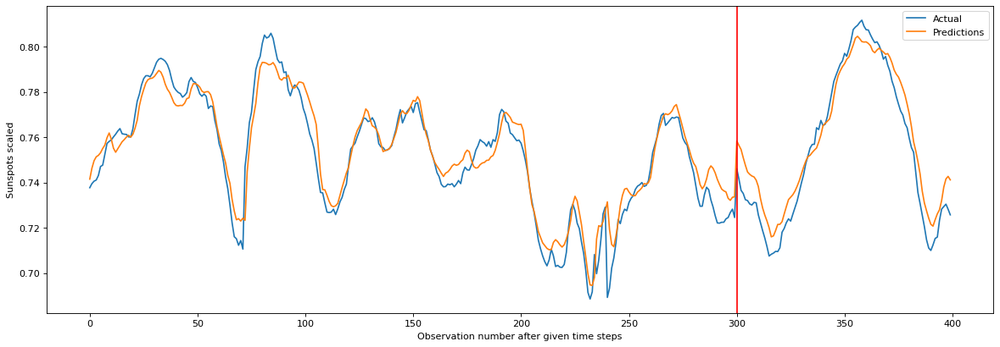

In [134]:
plot_result(Y_train[-300:,0], Y_test[:100,0], train_predictions[-300:,0], test_predictions[:100,0])

### Plot the predicted values temperature

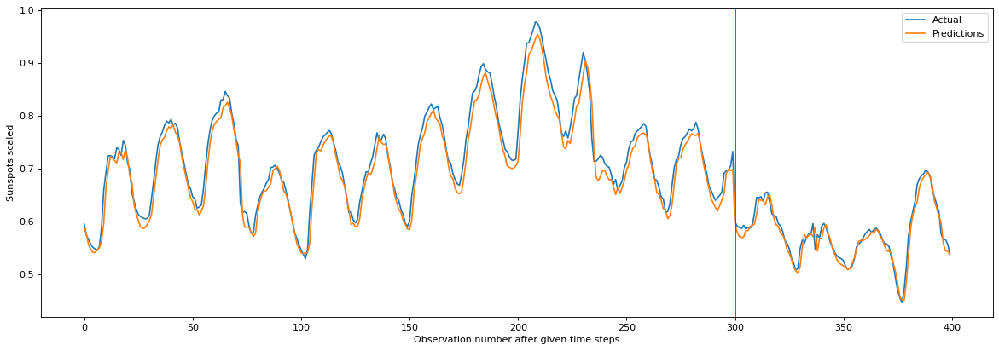

In [135]:
plot_result(Y_train[-300:,1], Y_test[:100,1], train_predictions[-300:,1], test_predictions[:100,1])

### RMSE

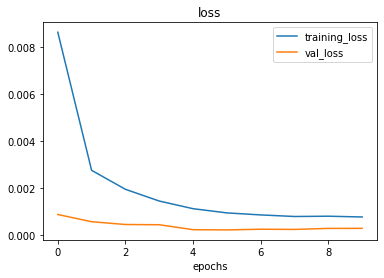

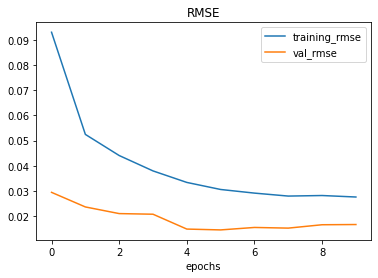

In [136]:
plot_loss_curves(history)

# CNN and LSTM Stacked
###Using the same layers from the CNN and LSTM model, stack the CNN as input to the pair of LSTMs.

In [137]:
def lstm_cnn_model(n_horizon):
    
    model = tf.keras.models.Sequential([
        tf.keras.layers.InputLayer(X_train.shape[1:]),
        tf.keras.layers.Conv1D(64, kernel_size=6, activation='relu',padding='same'),
        tf.keras.layers.MaxPooling1D(2),
        tf.keras.layers.Conv1D(64, kernel_size=3, activation='relu',padding='same'),
        tf.keras.layers.MaxPooling1D(2),
        tf.keras.layers.LSTM(32, activation='relu', return_sequences=True),
        tf.keras.layers.LSTM(32, activation='relu', return_sequences=False),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(64),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(n_horizon)
    ], name="lstm_cnn")
    
    
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=[RootMeanSquaredError()])
    
    
    return model


In [138]:
CNN_LSTM=cnn_model(2)
history_1 = CNN_LSTM.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10)

Epoch 1/10
1227/1227 [==============================] - 7s 5ms/step - loss: 0.0078 - root_mean_squared_error: 0.0884 - val_loss: 0.0017 - val_root_mean_squared_error: 0.0408
Epoch 2/10
1227/1227 [==============================] - 7s 6ms/step - loss: 0.0026 - root_mean_squared_error: 0.0508 - val_loss: 5.0948e-04 - val_root_mean_squared_error: 0.0226
Epoch 3/10
1227/1227 [==============================] - 7s 6ms/step - loss: 0.0018 - root_mean_squared_error: 0.0425 - val_loss: 3.6840e-04 - val_root_mean_squared_error: 0.0192
Epoch 4/10
1227/1227 [==============================] - 7s 6ms/step - loss: 0.0014 - root_mean_squared_error: 0.0370 - val_loss: 2.6357e-04 - val_root_mean_squared_error: 0.0162
Epoch 5/10
1227/1227 [==============================] - 7s 6ms/step - loss: 0.0011 - root_mean_squared_error: 0.0330 - val_loss: 3.1855e-04 - val_root_mean_squared_error: 0.0178
Epoch 6/10
1227/1227 [==============================] - 8s 7ms/step - loss: 9.2749e-04 - root_mean_squared_error: 

In [139]:
train_predictions = CNN_LSTM.predict(X_train)
test_predictions =CNN_LSTM.predict(X_test)

438/438 [==============================] - 1s 2ms/step


### Plot the predicted values Pressure

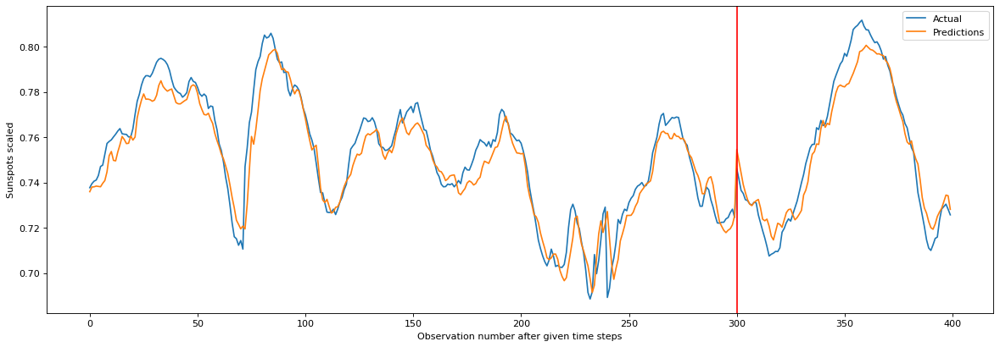

In [140]:
plot_result(Y_train[-300:,0], Y_test[:100,0], train_predictions[-300:,0], test_predictions[:100,0])

### Plot the predicted values Temperature

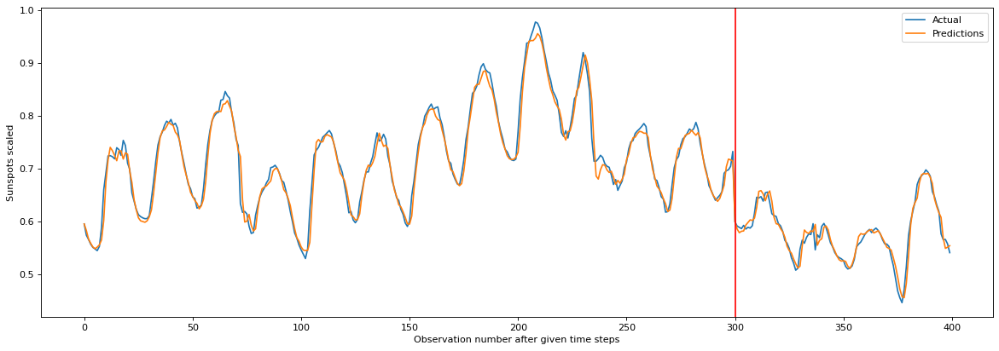

In [141]:
plot_result(Y_train[-300:,1], Y_test[:100,1], train_predictions[-300:,1], test_predictions[:100,1])

### RMSE

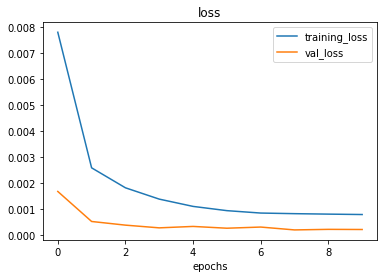

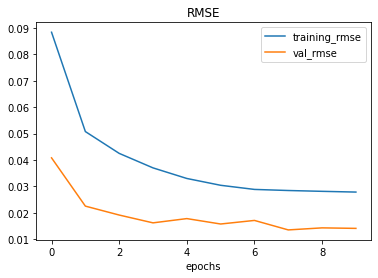

In [142]:
plot_loss_curves(history_1)

# CNN and LSTM with a skip connection
###The same CNN and LSTM layers as the previous models this time with a skip connection direct to the common DNN layer.

In [143]:
def lstm_cnn_skip_model(n_horizon):
    
    #inputs =tf.keras.layers.InputLayer(X_train.shape[1:])
    inputs = tf.keras.layers.Input(shape=X_train.shape[1:], name='main')
        
    conv1 = tf.keras.layers.Conv1D(64, kernel_size=6, activation='relu',padding='same')(inputs)
    max_pool_1 = tf.keras.layers.MaxPooling1D(2)(conv1)
    conv2 = tf.keras.layers.Conv1D(64, kernel_size=3, activation='relu',padding='same')(max_pool_1)
    max_pool_2 = tf.keras.layers.MaxPooling1D(2)(conv2)
    lstm_1 = tf.keras.layers.LSTM(32, activation='relu', return_sequences=True)(max_pool_2)
    lstm_2 = tf.keras.layers.LSTM(32, activation='relu', return_sequences=False)(lstm_1)
    flatten = tf.keras.layers.Flatten()(lstm_2)
    
    skip_flatten = tf.keras.layers.Flatten()(inputs)

    concat = tf.keras.layers.Concatenate(axis=-1)([flatten, skip_flatten])
    drop_1 = tf.keras.layers.Dropout(0.3)(concat)
    dense_1 = tf.keras.layers.Dense(128, activation='relu')(drop_1)
    drop_2 = tf.keras.layers.Dropout(0.3)(dense_1)
    output = tf.keras.layers.Dense(n_horizon)(drop_2)
    
    model = tf.keras.Model(inputs=inputs, outputs=output, name='lstm_skip')
     
    model.compile(loss='mean_squared_error', optimizer = tf.keras.optimizers.Adam(), metrics=[RootMeanSquaredError()])
    
    return model

In [144]:
CNN_LSTM_skip=lstm_cnn_skip_model(2)
history_2 = CNN_LSTM_skip.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10)

Epoch 1/10
1227/1227 [==============================] - 15s 10ms/step - loss: 0.0182 - root_mean_squared_error: 0.1350 - val_loss: 0.0076 - val_root_mean_squared_error: 0.0869
Epoch 2/10
1227/1227 [==============================] - 9s 8ms/step - loss: 0.0041 - root_mean_squared_error: 0.0642 - val_loss: 0.0025 - val_root_mean_squared_error: 0.0502
Epoch 3/10
1227/1227 [==============================] - 10s 8ms/step - loss: 0.0021 - root_mean_squared_error: 0.0457 - val_loss: 0.0014 - val_root_mean_squared_error: 0.0370
Epoch 4/10
1227/1227 [==============================] - 10s 9ms/step - loss: 0.0015 - root_mean_squared_error: 0.0389 - val_loss: 0.0014 - val_root_mean_squared_error: 0.0376
Epoch 5/10
1227/1227 [==============================] - 9s 7ms/step - loss: 0.0013 - root_mean_squared_error: 0.0357 - val_loss: 0.0014 - val_root_mean_squared_error: 0.0368
Epoch 6/10
1227/1227 [==============================] - 13s 11ms/step - loss: 0.0012 - root_mean_squared_error: 0.0341 - val_l

In [145]:
train_predictions = CNN_LSTM_skip.predict(X_train)
test_predictions =CNN_LSTM_skip.predict(X_test)

438/438 [==============================] - 1s 3ms/step


### Plot the predicted values Pressure

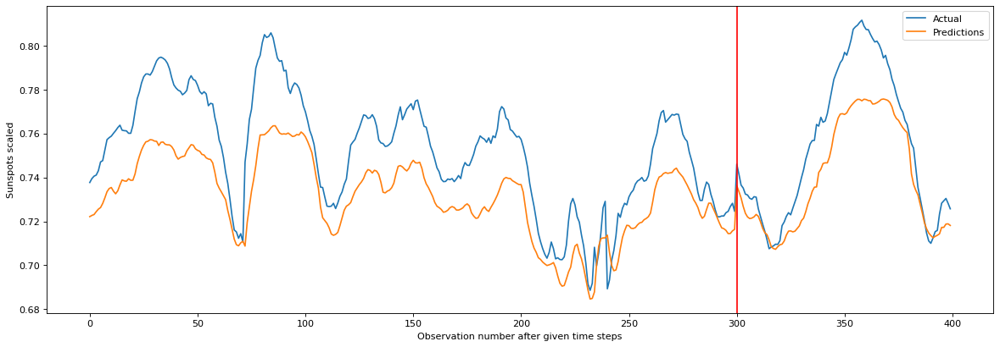

In [147]:
plot_result(Y_train[-300:,0], Y_test[:100,0], train_predictions[-300:,0], test_predictions[:100,0])

### Plot the predicted values temperature

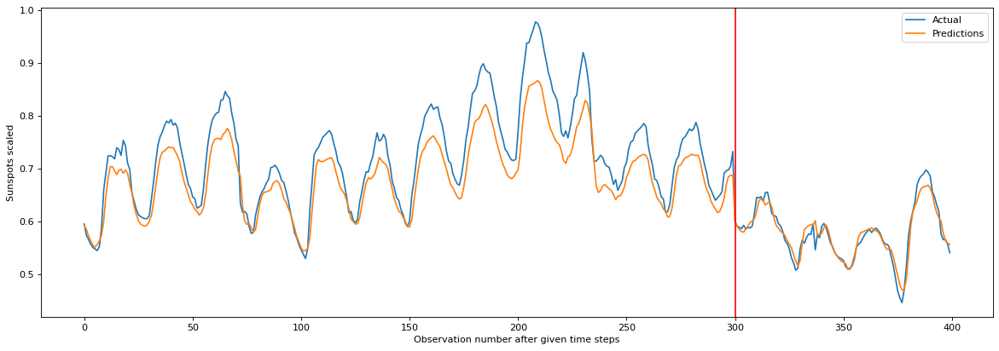

In [148]:
plot_result(Y_train[-300:,1], Y_test[:100,1], train_predictions[-300:,1], test_predictions[:100,1])

### RMSE

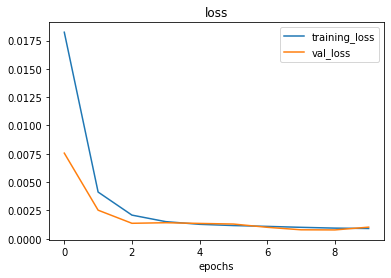

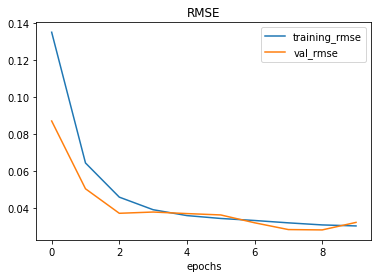

In [149]:
plot_loss_curves(history_2)

###**General interpretation: Among all the experiments carried out, it appears that the simple CNN model with two hidden layers offers results that are very close to the different complex models, even if the lstm_cnn_skip_mode converges quickly (after 4 epochs), hence the interest, in my opinion of using the simple CNN model in the prediction of pressure and temperature for this dataset, or the LSTM_dev model with three hidden layers, which offers excellent prediction with a simple architecture**